In [2]:
import numpy as np

from morphosnaker.segmentation import Segmentation
from morphosnaker.extractor import Extractor
import os
import tempfile
import unittest

import numpy as np
import tifffile

from morphosnaker.utils import ImageProcessor


In [3]:
image_path = "/Users/noahbruderer/Documents/Documents - Noah’s MacBook Pro - 1/Work_Documents/morphosnaker/tests/e2e/data/still_juvenile2_stack_1_img.tiff"
model_path = "/Users/noahbruderer/Documents/Documents - Noah’s MacBook Pro - 1/Work_Documents/morphosnaker/notebooks/model/CP_20240830_150119"

# Loading the image 

In [4]:
processor = ImageProcessor()

#first we inspect the image 
processor.inspect(image_path) 

image = processor.load(image_path, "XYC")

Inspecting source: '/Users/noahbruderer/Documents/Documents - Noah’s MacBook Pro - 1/Work_Documents/morphosnaker/tests/e2e/data/still_juvenile2_stack_1_img.tiff'


Inspecting files: 100%|██████████| 1/1 [00:00<00:00, 227.11it/s]



Inspecting: /Users/noahbruderer/Documents/Documents - Noah’s MacBook Pro - 1/Work_Documents/morphosnaker/tests/e2e/data/still_juvenile2_stack_1_img.tiff
Raw shape: (1024, 1024, 3)
Number of pages: 1
Data type: uint8
Value range: min = 0.0000, max = 254.0000

Inspected 1 file(s).
Loading source: '/Users/noahbruderer/Documents/Documents - Noah’s MacBook Pro - 1/Work_Documents/morphosnaker/tests/e2e/data/still_juvenile2_stack_1_img.tiff'


Loading files: 100%|██████████| 1/1 [00:00<00:00, 834.02it/s]

Input shape: (1024, 1024, 3), Input dims: XYC
After transposing existing dims: shape=(3, 1024, 1024), dims=CYX
After adding dimensions: shape=(1, 3, 1, 1024, 1024), dims=TCZYX


# Segment image

In [5]:
segmenting = Segmentation(method="cellpose")
segmenting.load_model(model_path)
segmenting.get_config()


/Users/noahbruderer/Library/Caches/pypoetry/virtualenvs/morphosnaker-l6Pc8h2W-py3.11/lib/python3.11/site-packages/cellpose/resnet_torch.py:280: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experim

CellposeConfig(method='cellpose', segmentation_mode='2D', trained_model_name='my_segmentation_model', result_dir='./segmentation_results', fig_dir='figures', channel=0, channels=(0, 0), model_type='cyto3', flow_threshold=0.4, cellprob_threshold=0.0, min_size=15, stitch_threshold=0.0, do_3D=False, diameter=30.0)

In [23]:
segmented_image = segmenting.predict(image)

In [7]:
segmented_image.shape

(1024, 1024)

In [8]:
import tifffile

tifffile.imwrite("saved_image.tiff", segmented_image)
tifffile.imwrite("raw.tiff", image)

In [9]:
import plotly.express as px

fig = px.imshow(segmented_image)
fig.show()

# LETS TRY TO FIX THE ERRORS

In [24]:
from morphosnaker.extractor import Extractor
import numpy as np
import plotly.express as px

# Assuming you have your segmented_image from Cellpose

# Get an instance of MaskCurator
curator = Extractor.mask_curator()

# Apply curation methods
filled_holes = curator.fill_holes(segmented_image)
removed_small_objects = curator.remove_small_objects(segmented_image, min_size=50)
cleared_border = curator.clear_border(segmented_image, buffer_size=5)
separated_objects = curator.separate_touching_objects(segmented_image)

# Apply multiple methods at once
# Example mask and method usage
curated_mask = curator.curate(
    segmented_image,
    methods=["remove_small_objects", "fill_holes", "label_unsegmented_holes", "fuse_small_holes_with_neighbors"],
    remove_small_objects={"min_size": 100},
    label_unsegmented_holes={"min_hole_size": 50},
    fuse_small_holes_with_neighbors={"max_hole_size": 50}
)
# Visualization function
def plot_masks(masks, titles):
    fig = px.imshow(
        np.array(masks),
        facet_col=0,
        binary_string=True,
        labels={'facet_col': 'Mask Type'}
    )
    for i, title in enumerate(titles):
        fig.layout.annotations[i]['text'] = title
    fig.show()

def plot_masks_with_colors(masks, titles):
    # Generate random colors for each mask
    n_masks = np.max(masks) + 1  # Number of unique mask labels (including background)
    
    # Random color map
    random_cmap = np.random.rand(n_masks, 3)  # RGB values between 0 and 1
    
    # Apply the random colors to the mask
    colored_masks = random_cmap[masks]
    
    fig = px.imshow(
        colored_masks,
        facet_col=0,
        labels={'facet_col': 'Mask Type'}
    )
    
    # Update titles
    for i, title in enumerate(titles):
        fig.layout.annotations[i]['text'] = title
    
    fig.show()
# Prepare masks and titles for visualization
masks = [segmented_image, filled_holes, removed_small_objects, cleared_border, separated_objects, curated_mask]
titles = ['Original', 'Filled Holes', 'Removed Small Objects', 'Cleared Border', 'Separated Objects', 'Curated Mask']

# Plot all masks
plot_masks(masks, titles)
plot_masks_with_colors(masks, titles)

# # If you want to use other extractors:
# neighborhood_extractor = Extractor.neighborhood()
# shape_factor_extractor = Extractor.shape_factors()

# # Use these extractors as needed
# neighborhood_data = neighborhood_extractor.extract(segmented_image)
# shape_factors = shape_factor_extractor.extract(segmented_image)

In [25]:

import numpy as np
import plotly.express as px
from skimage.measure import regionprops
import matplotlib.pyplot as plt

def get_object_sizes(mask):
    regions = regionprops(mask)
    sizes = [region.area for region in regions]
    return sizes


# Visualization function to display masks in grayscale and object size distributions
def plot_masks_with_size_distribution(masks, titles):
    fig, axs = plt.subplots(len(masks), 2, figsize=(10, 5 * len(masks)))

    for i, mask in enumerate(masks):
        # Plot the mask
        axs[i, 0].imshow(mask, cmap='gray')
        axs[i, 0].set_title(titles[i])

        # Get object sizes and plot the histogram
        sizes = get_object_sizes(mask)
        axs[i, 1].hist(sizes, bins=30, color='blue', alpha=0.7)
        axs[i, 1].set_title(f'Object Size Distribution for {titles[i]}')
        axs[i, 1].set_xlabel('Size (Pixels)')
        axs[i, 1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()
# Get an instance of MaskCurator
curator = Extractor.mask_curator()

# Apply curation methods individually
filled_holes = curator.fill_holes(segmented_image)
removed_small_objects = curator.remove_small_objects(segmented_image, min_size=50)
cleared_border = curator.clear_border(segmented_image, buffer_size=5)
separated_objects = curator.separate_touching_objects(segmented_image)

# Apply multiple curation methods at once
curated_mask = curator.curate(
    segmented_image,
    methods=["remove_small_objects", "fill_holes", "label_unsegmented_holes", "fuse_small_holes_with_neighbors"],
    remove_small_objects={"min_size": 10},
    label_unsegmented_holes={"min_hole_size": 100},
    fuse_small_holes_with_neighbors={"max_hole_size": 200}
)
def get_object_sizes(mask):
    regions = regionprops(mask)
    sizes = [region.area for region in regions]
    return sizes


# Visualization function to display masks in grayscale and object size distributions
def plot_masks_with_size_distribution(masks, titles):
    fig, axs = plt.subplots(len(masks), 2, figsize=(10, 5 * len(masks)))

    for i, mask in enumerate(masks):
        # Plot the mask
        axs[i, 0].imshow(mask, cmap='gray')
        axs[i, 0].set_title(titles[i])

        # Get object sizes and plot the histogram
        sizes = get_object_sizes(mask)
        axs[i, 1].hist(sizes, bins=30, color='blue', alpha=0.7)
        axs[i, 1].set_title(f'Object Size Distribution for {titles[i]}')
        axs[i, 1].set_xlabel('Size (Pixels)')
        axs[i, 1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()
# Visualization function to display masks in grayscale
def plot_masks(masks, titles):
    fig = px.imshow(
        np.array(masks),
        facet_col=0,
        binary_string=True,
        labels={'facet_col': 'Mask Type'}
    )
    for i, title in enumerate(titles):
        fig.layout.annotations[i]['text'] = title
    fig.show()

# Visualization function to display masks with random colors
def plot_masks_with_colors(masks, titles):
    # Generate random colors for each mask
    n_masks = np.max(masks) + 1  # Number of unique mask labels (including background)
    
    # Random color map
    random_cmap = np.random.rand(n_masks, 3)  # RGB values between 0 and 1
    
    # Apply the random colors to the mask
    colored_masks = random_cmap[masks]
    
    fig = px.imshow(
        colored_masks,
        facet_col=0,
        labels={'facet_col': 'Mask Type'}
    )
    
    # Update titles
    for i, title in enumerate(titles):
        fig.layout.annotations[i]['text'] = title
    
    fig.show()

# Prepare masks and titles for visualization
masks = [segmented_image, filled_holes, removed_small_objects, cleared_border, separated_objects, curated_mask]
titles = ['Original', 'Filled Holes', 'Removed Small Objects', 'Cleared Border', 'Separated Objects', 'Curated Mask']

# Plot all masks in grayscale
plot_masks(masks, titles)

# Plot all masks with random colors
plot_masks_with_colors(masks, titles)

TypeError: Non-integer image types are ambiguous: use skimage.measure.label to label the connected components of label_image, or label_image.astype(np.uint8) to interpret the True values as a single label.

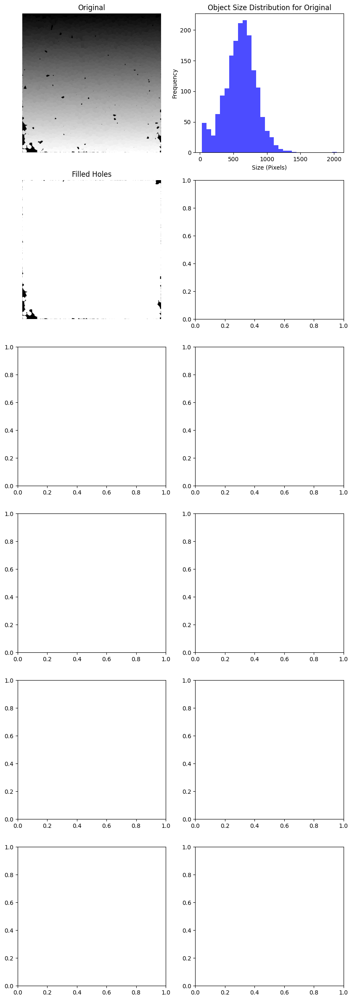

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops
import plotly.express as px


def get_object_sizes(mask):
    # Extract object sizes (areas) from the mask using regionprops
    regions = regionprops(mask)
    sizes = [region.area for region in regions]
    return sizes


# Visualization function to display masks in grayscale and object size distributions below each mask
def plot_masks_with_size_distribution(masks, titles):
    # Create a figure with 2 rows for each mask: one for the mask, one for the size distribution
    fig, axs = plt.subplots(len(masks), 2, figsize=(10, 5 * len(masks)))

    for i, mask in enumerate(masks):
        # Plot the mask in grayscale
        axs[i, 0].imshow(mask, cmap='gray', aspect='equal')
        axs[i, 0].set_title(titles[i])
        axs[i, 0].axis('off')  # Hide axes for masks

        # Get object sizes and plot the histogram
        sizes = get_object_sizes(mask)
        axs[i, 1].hist(sizes, bins=30, color='blue', alpha=0.7)
        axs[i, 1].set_title(f'Object Size Distribution for {titles[i]}')
        axs[i, 1].set_xlabel('Size (Pixels)')
        axs[i, 1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()


# Assuming you have your segmented_image from Cellpose

# Example MaskCurator functions
curator = Extractor.mask_curator()
filled_holes = curator.fill_holes(segmented_image)
removed_small_objects = curator.remove_small_objects(segmented_image, min_size=50)
cleared_border = curator.clear_border(segmented_image, buffer_size=5)
separated_objects = curator.separate_touching_objects(segmented_image)

# Apply multiple curation methods at once
curated_mask = curator.curate(
    segmented_image,
    methods=["remove_small_objects", "fill_holes", "label_unsegmented_holes", "fuse_small_holes_with_neighbors"],
    remove_small_objects={"min_size": 10},
    label_unsegmented_holes={"min_hole_size": 100},
    fuse_small_holes_with_neighbors={"max_hole_size": 200}
)

# Prepare masks and titles for visualization
masks = [segmented_image, filled_holes, removed_small_objects, cleared_border, separated_objects, curated_mask]
titles = ['Original', 'Filled Holes', 'Removed Small Objects', 'Cleared Border', 'Separated Objects', 'Curated Mask']

# Plot all masks with object size distribution below each
plot_masks_with_size_distribution(masks, titles)